In [389]:
import pandas as pd
import uuid
str(uuid.uuid4())

'4ba0aa9d-1c1d-4a3a-9e17-b683aac356ac'

In [390]:
df = pd.read_csv('embeddings.csv')

In [391]:
df.head(2)

,p_id,name,price,colour,brand,img,description,image_embedding,text_embedding,combined_embeddings
0,16697006,KALINI Maroon & Gold Ethnic Motifs Zari Silk B...,2099.0,Maroon,KALINI,http://assets.myntassets.com/assets/images/166...,Design Details Maroon and gold-toned banar...,"[0.0496022031, -0.104508556, 0.0298194699, 0.0...","[0.134989128, -0.243524104, 0.0128166657, 0.01...","[0.09229566555, -0.17401633, 0.0213180678, 0.0..."
1,18989580,Meena Bazaar Beige & Pink Printed Pure Cotton ...,2995.0,Beige,Meena Bazaar,http://assets.myntassets.com/assets/images/189...,Beige and pink printed unstitched dress materi...,"[0.00952296332, -0.0437196, 0.0335348099, -0.0...","[0.143996894, -0.0869426206, -0.0123864012, -0...","[0.07675992865999999, -0.0653311103, 0.0105742..."


In [392]:
df.drop_duplicates(inplace=True)

In [393]:
df['uuid'] = [str(uuid.uuid4()) for i in range(len(df))]

In [394]:
df.head()

,p_id,name,price,colour,brand,img,description,image_embedding,text_embedding,combined_embeddings,uuid
0,16697006,KALINI Maroon & Gold Ethnic Motifs Zari Silk B...,2099.0,Maroon,KALINI,http://assets.myntassets.com/assets/images/166...,Design Details Maroon and gold-toned banar...,"[0.0496022031, -0.104508556, 0.0298194699, 0.0...","[0.134989128, -0.243524104, 0.0128166657, 0.01...","[0.09229566555, -0.17401633, 0.0213180678, 0.0...",708d6aba-5816-4631-a897-0b603e3a7b84
1,18989580,Meena Bazaar Beige & Pink Printed Pure Cotton ...,2995.0,Beige,Meena Bazaar,http://assets.myntassets.com/assets/images/189...,Beige and pink printed unstitched dress materi...,"[0.00952296332, -0.0437196, 0.0335348099, -0.0...","[0.143996894, -0.0869426206, -0.0123864012, -0...","[0.07675992865999999, -0.0653311103, 0.0105742...",4346bb29-bc1d-43ec-911c-e558c5583313
2,17639400,United Colors of Benetton Girls Navy-Blue Soli...,1699.0,Navy Blue,United Colors of Benetton,http://assets.myntassets.com/assets/images/176...,"Navy blue solid flared knee-length skirt, has ...","[0.0233918633, 0.0101279495, -7.40312607e-05, ...","[0.192833036, -0.118194662, -0.042408254, 0.03...","[0.10811244965000001, -0.054033356250000004, -...",032577ac-a549-4116-b542-8ed3b01cf5eb
3,18705036,ArtEastri Maroon & White Striped Kantha Work P...,3990.0,Maroon,ArtEastri,http://assets.myntassets.com/assets/images/187...,Design Details Maroon and white saree St...,"[0.0114591, -0.109037459, 0.0150656831, 0.0813...","[0.198823527, -0.175233871, -0.0106793894, 0.0...","[0.1051413135, -0.14213566500000002, 0.0021931...",8b983409-1e3c-44be-b898-de339a710f50
4,14166356,Bitterlime Women White & Black Solid Top with ...,2299.0,White,Bitterlime,http://assets.myntassets.com/assets/images/141...,This clothing set consists of top and skirtWhi...,"[0.0538686477, -0.0315646343, 0.0148850055, 0....","[0.254852891, -0.119898438, -0.00382666732, 0....","[0.15436076935, -0.07573153615, 0.005529169089...",ab0aa242-7198-4ead-b8a6-025093bce36a


In [396]:
type(df.image_embedding[0])

str

In [411]:
# type(eval("[5, 2, 1]"))

In [ ]:
df.image_embedding = df.image_embedding.apply(eval)
df.text_embedding = df.text_embedding.apply(eval)
df.combined_embeddings = df.combined_embeddings.apply(eval)

In [58]:
metadata = df.iloc[:, :7].to_dict('records')
ids = df.uuid.values.tolist()
text_embedding = df.text_embedding.values.tolist()
image_embedding = df.image_embedding.values.tolist()
combined_embeddings = df.combined_embeddings.values.tolist()

In [59]:
# !pip install qdrant-client

In [60]:
from qdrant_client import QdrantClient
from qdrant_client.models import Distance, VectorParams
import shutil
import os

path = 'vectordb'
if os.path.exists(path):
    shutil.rmtree(path) 
    
client = QdrantClient(path=path)

In [61]:
try:
    client.create_collection(
        collection_name="text_embedding",
        vectors_config=VectorParams(size=128, distance=Distance.COSINE),
    )
    client.create_collection(
        collection_name="image_embedding",
        vectors_config=VectorParams(size=128, distance=Distance.COSINE),
    )
    client.create_collection(
        collection_name="combined_embeddings",
        vectors_config=VectorParams(size=128, distance=Distance.COSINE),
    )
except Exception as e:
    print(e)

In [62]:
import uuid
text_points = [PointStruct(id=uid,vector=emb,payload=met) for uid, emb, met in zip(ids, text_embedding, metadata)]
image_points = [PointStruct(id=uid,vector=emb,payload=met) for uid, emb, met in zip(ids, image_embedding, metadata)]
combined_embeddings_points = [PointStruct(id=uid,vector=emb,payload=met) for uid, emb, met in zip(ids, combined_embeddings, metadata)]

In [63]:
from qdrant_client.models import PointStruct
client.upsert(collection_name="text_embedding",points=text_points)

UpdateResult(operation_id=0, status=<UpdateStatus.COMPLETED: 'completed'>)

In [64]:
client.upsert(collection_name="image_embedding",points=image_points)

UpdateResult(operation_id=0, status=<UpdateStatus.COMPLETED: 'completed'>)

In [65]:
client.upsert(collection_name="combined_embeddings",points=combined_embeddings_points)

UpdateResult(operation_id=0, status=<UpdateStatus.COMPLETED: 'completed'>)

In [119]:
import vertexai
import numpy as np
from vertexai.vision_models import Image, MultiModalEmbeddingModel
model = MultiModalEmbeddingModel.from_pretrained("multimodalembedding")

def get_image_text_embdeeing(query, image=None):
    embeddings = model.get_embeddings(image=image,contextual_text=query,dimension=128)
    if image is None and query is not None:
        # Only text query is provided
        return embeddings.text_embedding
    elif query is None and image is not None:
        # Only image is provided
        return embeddings.image_embedding
    else:
        # Both image and query are provided
        return (np.array(embeddings.image_embedding) + np.array(embeddings.text_embedding)) / 2


# Text to Image Search

In [120]:
query = "White Embroidered Kurta"
image = None
query_vector = get_image_text_embdeeing(query, image=None)

In [121]:
hits = client.search(
    collection_name="text_embedding",
    query_vector=query_vector,
    limit=3 # Return 5 closest points
)


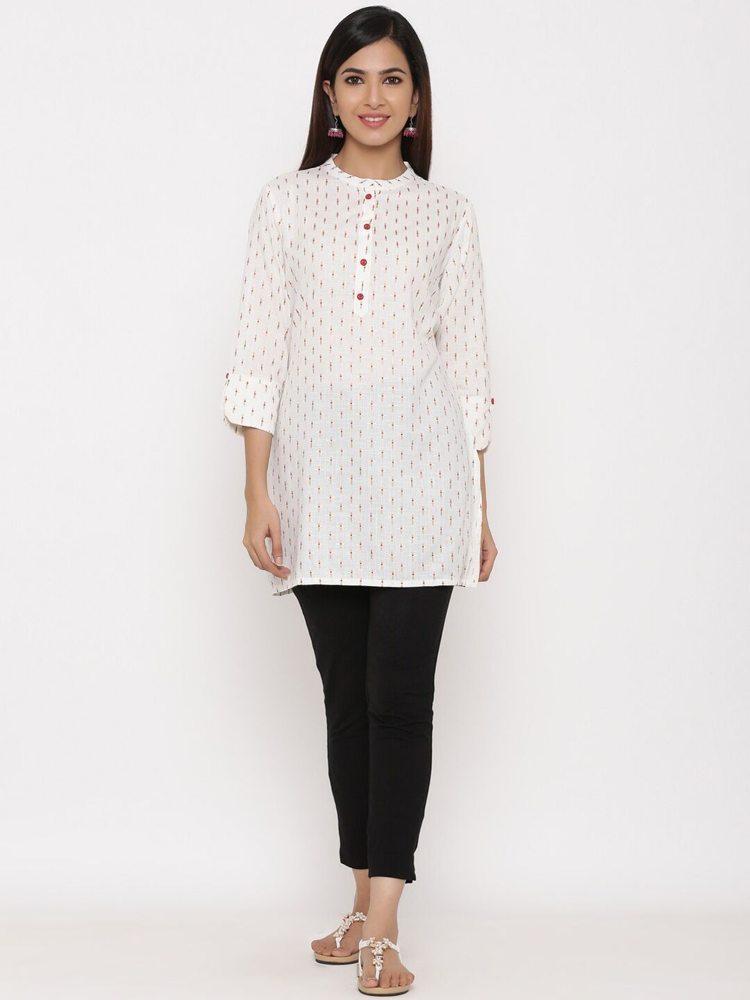
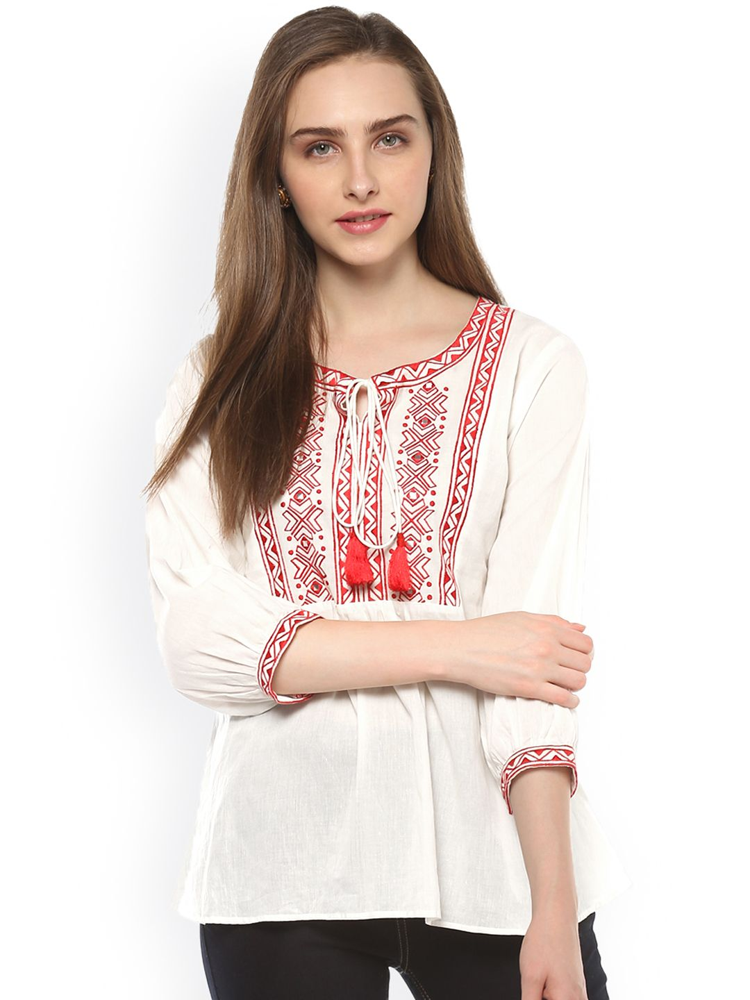
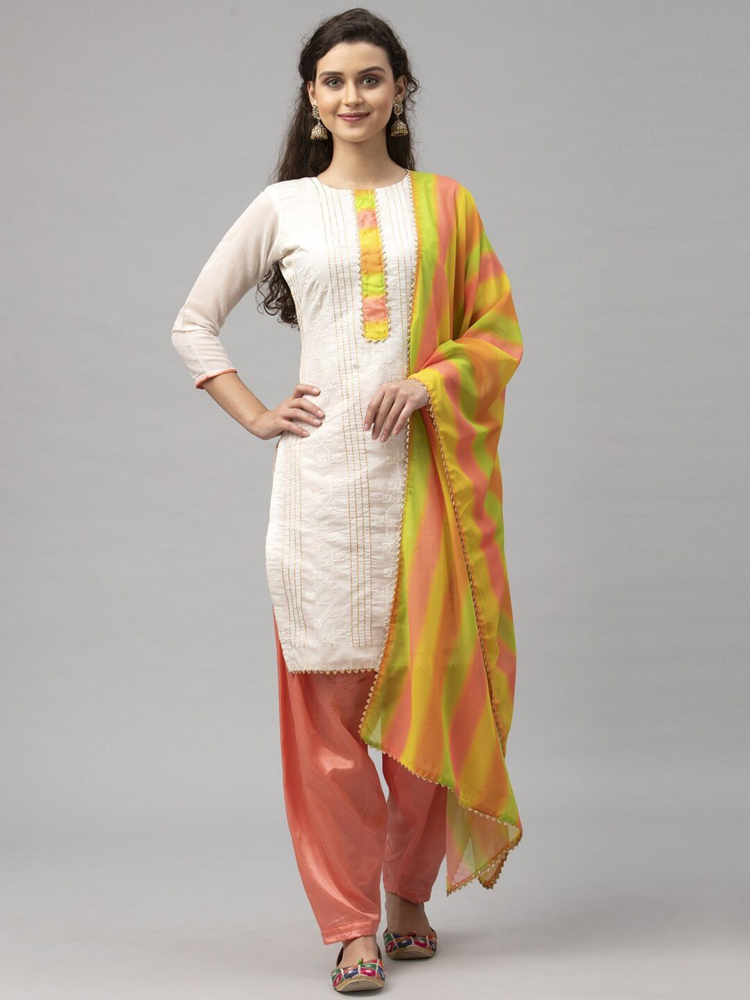

In [122]:
import PIL.Image 
import requests
from io import BytesIO
from IPython.display import display, HTML
import base64
def fetch_images(scored_points):
    images = []
    for point in scored_points:
        img_url = point.payload.get('img')
        if img_url:
            try:
                response = requests.get(img_url)
                image = PIL.Image.open(BytesIO(response.content))
                images.append(image)
            except Exception as e:
                print(f"An error occurred while processing image {img_url}: {e}")
    return images

def display_images_horizontally(images):
    # Create HTML for displaying images horizontally
    html = '<div style="display: flex;">'
    for image in images:
        # Save the image to a BytesIO object
        buffered = BytesIO()
        image.save(buffered, format="PNG")
        img_str = f"data:image/png;base64,{base64.b64encode(buffered.getvalue()).decode()}"
        html += f'<img src="{img_str}" style="height: 400px; width: 300px; margin-right: 10px;">'
    html += '</div>'
    
    display(HTML(html))

images = fetch_images(hits)
display_images_horizontally(images)

# Image to Image Search

In [213]:
image_url = 'https://rukminim2.flixcart.com/image/850/1000/xif0q/shopsy-short/s/j/s/xs-ssh103a-high-waist-shorts-winered-women-original-imaghmgbhzsqwjkh.jpeg'

In [214]:
import requests
from vertexai.vision_models import Image
response = requests.get(image_url)
image_bytes = response.content
image = Image(image_bytes=image_bytes)

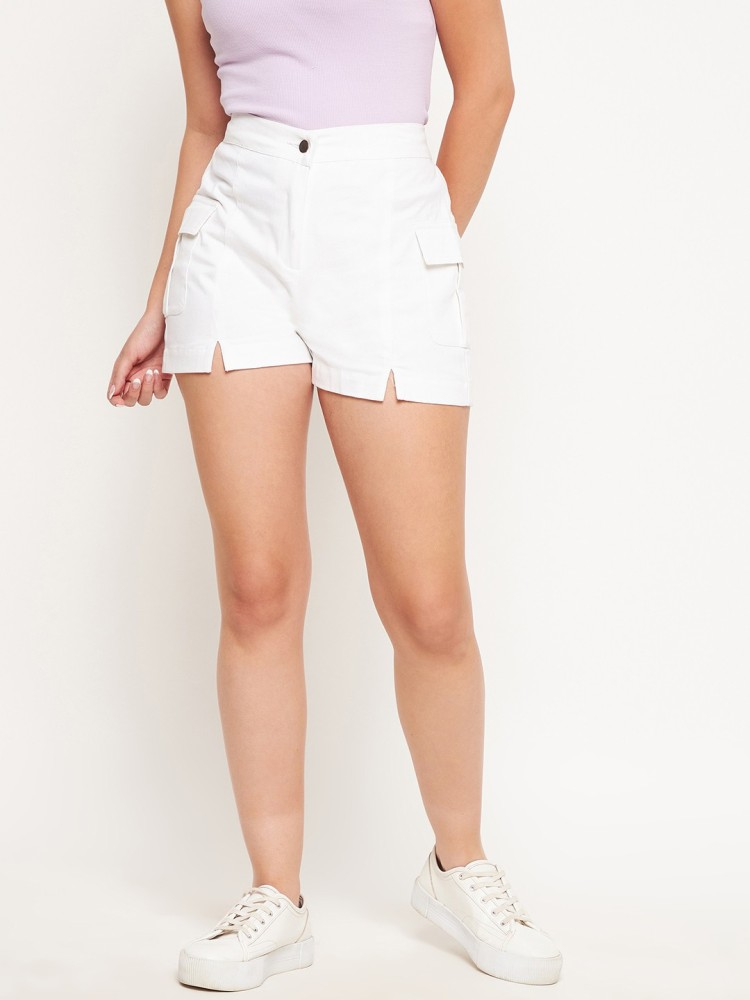

In [215]:
image.show()

In [216]:
query_vector = get_image_text_embdeeing(query=None, image=image)

In [217]:
hits = client.search(
    collection_name="image_embedding",
    query_vector=query_vector,
    limit=3 # Return 5 closest points
)


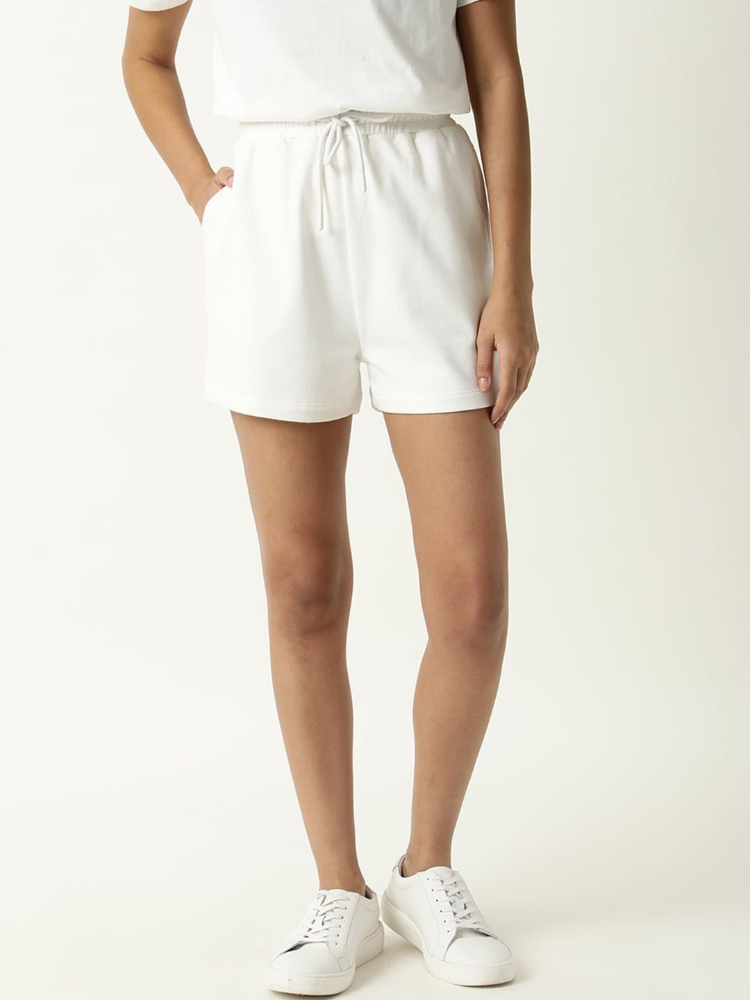
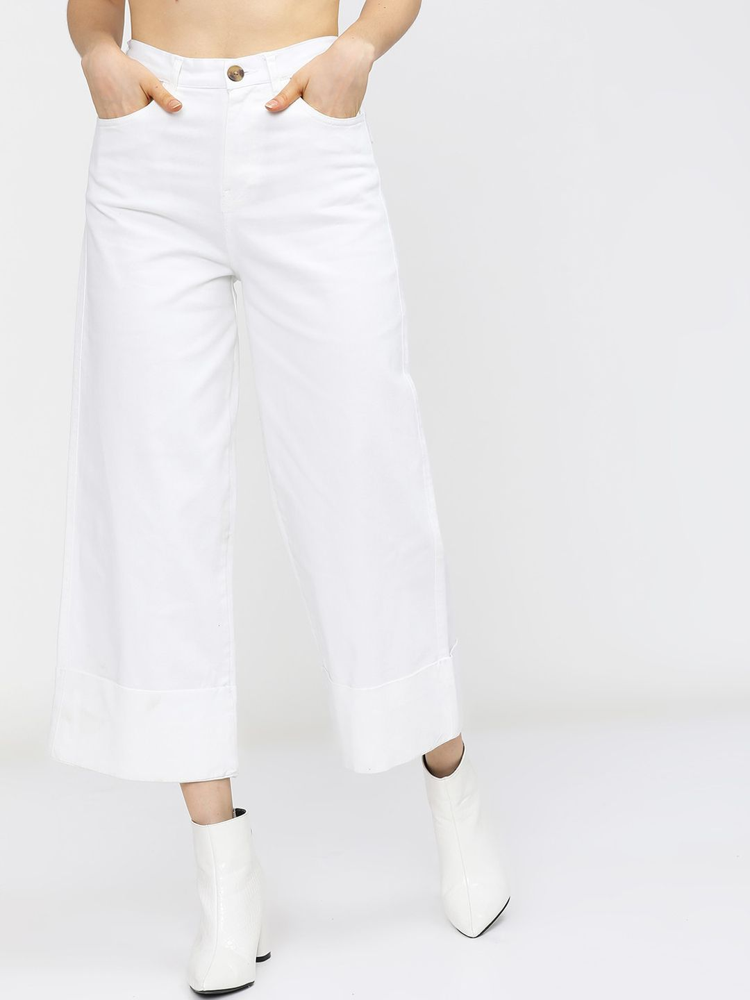
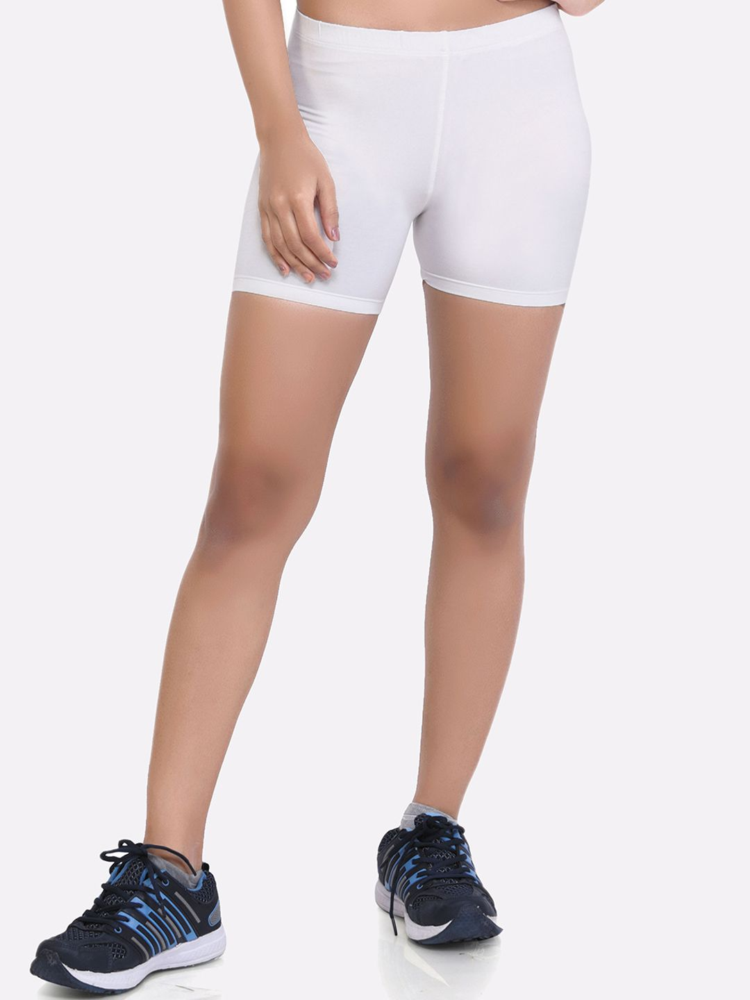

In [218]:
images = fetch_images(hits)
display_images_horizontally(images)

# Text + Image to image search

In [402]:
image_url = "https://static.wixstatic.com/media/3a6819_3a05ee5fe68d49209639eba6f5d34f60~mv2.jpg/v1/fill/w_650,h_812,al_c,q_85,enc_auto/3a6819_3a05ee5fe68d49209639eba6f5d34f60~mv2.jpg"
import requests
from vertexai.vision_models import Image
response = requests.get(image_url)
image_bytes = response.content
image = Image(image_bytes=image_bytes)

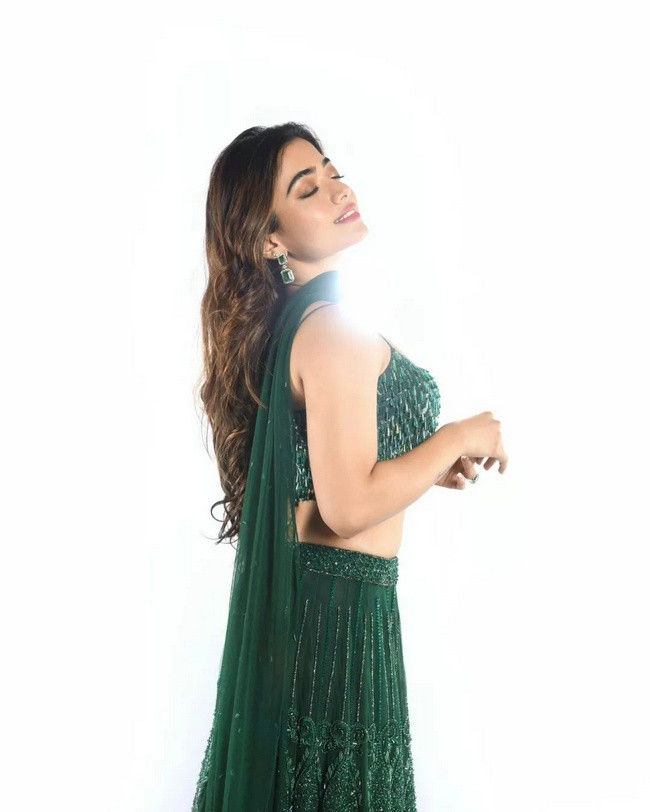

In [403]:
image.show()

In [404]:
query_vector = get_image_text_embdeeing(query="Green Lehenga Choli", image=image)

In [405]:
hits = client.search(
    collection_name="combined_embeddings",
    query_vector=query_vector,
    limit=3 
)


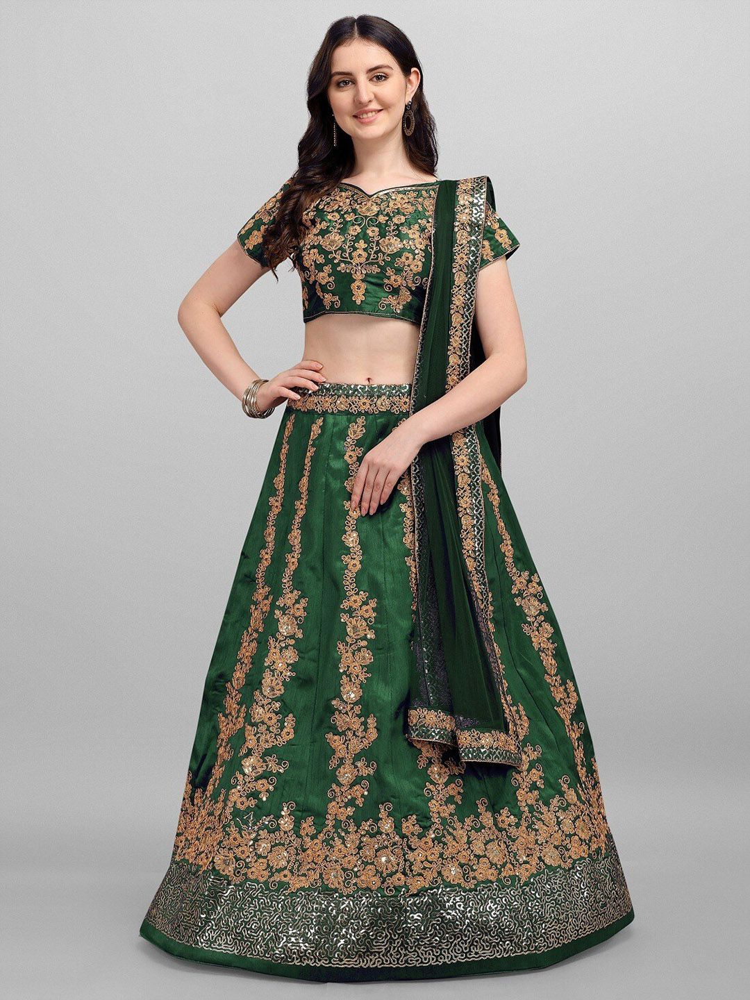
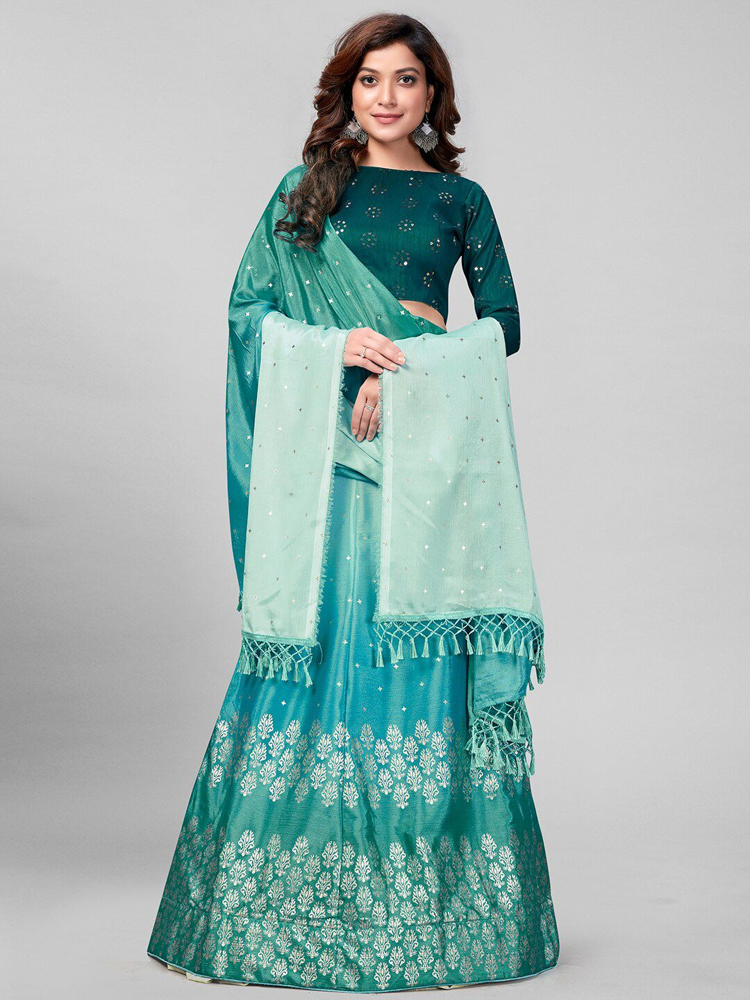
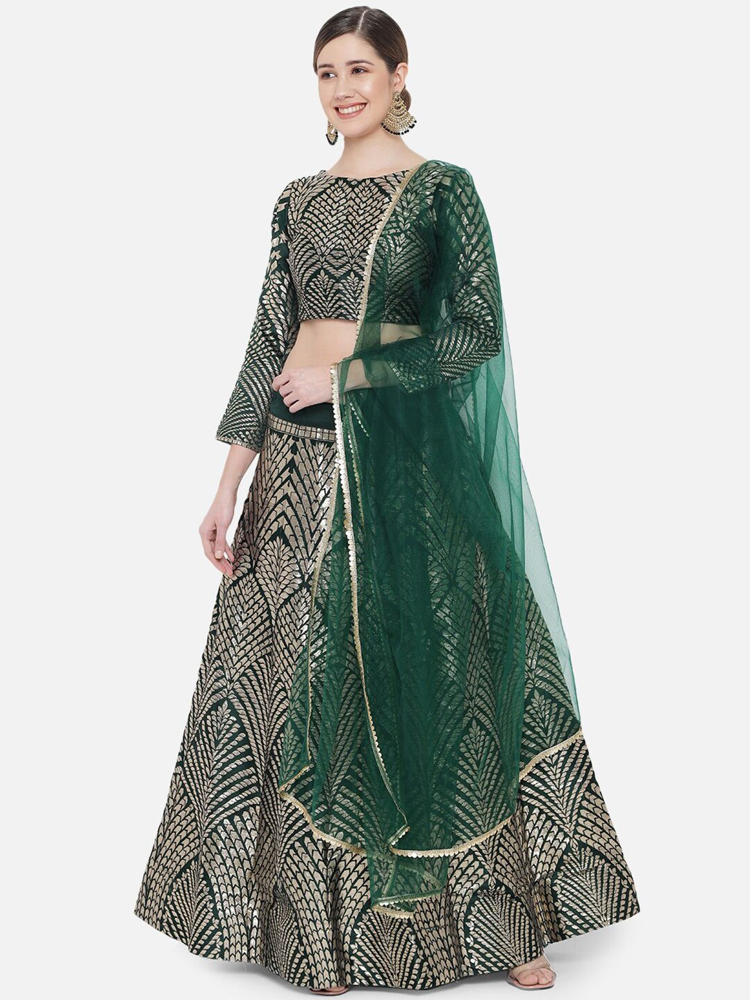

In [406]:
images = fetch_images(hits)
display_images_horizontally(images)